In [1]:
!pip install pytorch-ignite

In [2]:
import torch
import torchvision
import ignite

print(*map(lambda m: ": ".join((m.__name__, m.__version__)), (torch, torchvision, ignite)), sep="\n")

torch: 2.3.0
torchvision: 0.18.0
ignite: 0.5.0.post2


In [3]:
import os
import logging
import matplotlib.pyplot as plt

import numpy as np
from torchviz import make_dot
from torchsummary import summary

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import DataLoader, Subset, random_split
from ignite.engine import Engine, Events
import ignite.distributed as idist

In [4]:
ignite.utils.manual_seed(999)

In [5]:
ignite.utils.setup_logger(name="ignite.distributed.auto.auto_dataloader", level=logging.WARNING)
ignite.utils.setup_logger(name="ignite.distributed.launcher.Parallel", level=logging.WARNING)

<Logger ignite.distributed.launcher.Parallel (WARNING)>

In [6]:
import os
import glob

# Define the directory path where files have been unzipped
directory_path = r'D:\Semester 4\Deep Learning\anime'

# List all files in the directory
all_files = glob.glob(os.path.join(directory_path, '**', '*'), recursive=True)

# Print all files
print("All files:")
for file in all_files:
    print(file)

# Select specific files (e.g., only JPEG images)
jpeg_files = glob.glob(os.path.join(directory_path, '**', '*.jpg'), recursive=True)

# Print selected JPEG files
print("\nSelected JPEG files:")
for file in jpeg_files:
    print(file)

All files:
D:\Semester 4\Deep Learning\anime\images
D:\Semester 4\Deep Learning\anime\images\0_2000.jpg
D:\Semester 4\Deep Learning\anime\images\10000_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10001_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10002_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10003_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10004_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10005_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10006_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10007_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10008_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10009_2004.jpg
D:\Semester 4\Deep Learning\anime\images\1000_2000.jpg
D:\Semester 4\Deep Learning\anime\images\10010_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10011_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10012_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10013_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10014_2004.jpg
D

In [7]:
image_size = 64

data_transform = transforms.Compose(
    [
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]
)

train_dataset = ImageFolder(root="./anime", transform=data_transform)

# Split dataset into train and test
test_size = int(0.2 * len(train_dataset))
train_size = len(train_dataset) - test_size
train_dataset, test_dataset = random_split(train_dataset, [train_size, test_size])

In [8]:
batch_size = 128

train_dataloader = idist.auto_dataloader(
    train_dataset, 
    batch_size=batch_size, 
    num_workers=2, 
    shuffle=True, 
    drop_last=True,
)

test_dataloader = idist.auto_dataloader(
    test_dataset, 
    batch_size=batch_size, 
    num_workers=2, 
    shuffle=False, 
    drop_last=True,
)

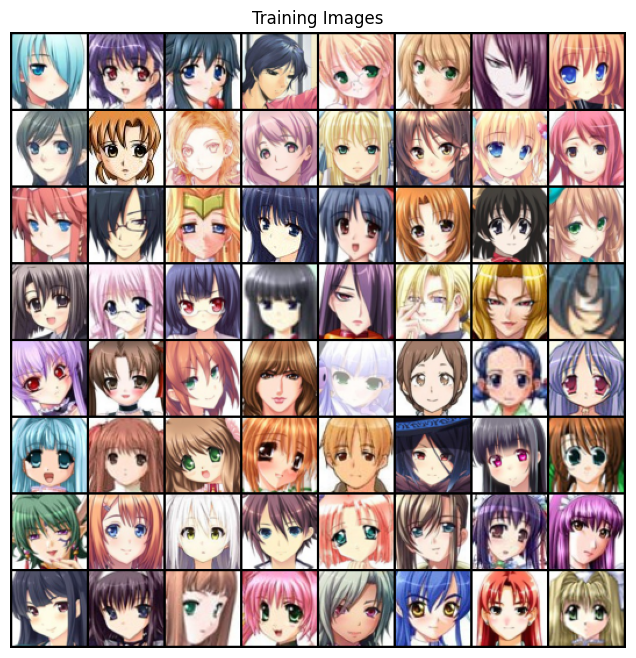

In [9]:
real_batch = next(iter(train_dataloader))

# Display the images
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

## Models for GAN

In [10]:
latent_dim = 100

In [11]:

class GeneratorDCGAN_NoBatchNorm(nn.Module):
    def __init__(self, latent_dim):
        super(GeneratorDCGAN_NoBatchNorm, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.model(x)
        return x

In [13]:
netG = idist.auto_model(GeneratorDCGAN_NoBatchNorm(latent_dim))

In [14]:
idist.device()

device(type='cuda')

In [15]:
summary(netG, (latent_dim, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 3, 64, 64]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           819,200
|    └─ReLU: 2-2                         [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-3              [-1, 256, 8, 8]           2,097,152
|    └─ReLU: 2-4                         [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-5              [-1, 128, 16, 16]         524,288
|    └─ReLU: 2-6                         [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-7              [-1, 64, 32, 32]          131,072
|    └─ReLU: 2-8                         [-1, 64, 32, 32]          --
|    └─ConvTranspose2d: 2-9              [-1, 3, 64, 64]           3,072
|    └─Tanh: 2-10                        [-1, 3, 64, 64]           --
Total params: 3,574,784
Trainable params: 3,574,784
Non-trainable params: 0
Total mult-adds (M): 431.92
Input size (MB): 0.00
Forw

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 3, 64, 64]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           819,200
|    └─ReLU: 2-2                         [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-3              [-1, 256, 8, 8]           2,097,152
|    └─ReLU: 2-4                         [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-5              [-1, 128, 16, 16]         524,288
|    └─ReLU: 2-6                         [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-7              [-1, 64, 32, 32]          131,072
|    └─ReLU: 2-8                         [-1, 64, 32, 32]          --
|    └─ConvTranspose2d: 2-9              [-1, 3, 64, 64]           3,072
|    └─Tanh: 2-10                        [-1, 3, 64, 64]           --
Total params: 3,574,784
Trainable params: 3,574,784
Non-trainable params: 0
Total mult-adds (M): 431.92
Input size (MB): 0.00
Forw

### Discriminator

In [16]:
class DiscriminatorDCGAN_NoBatchNorm(nn.Module):
    def __init__(self):
        super(DiscriminatorDCGAN_NoBatchNorm, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.model(x)
        return x

In [17]:
netD = idist.auto_model(DiscriminatorDCGAN_NoBatchNorm())
summary(netD, (3, 64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 1, 1, 1]             --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─LeakyReLU: 2-4                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-5                       [-1, 256, 8, 8]           524,288
|    └─LeakyReLU: 2-6                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-7                       [-1, 512, 4, 4]           2,097,152
|    └─LeakyReLU: 2-8                    [-1, 512, 4, 4]           --
|    └─Conv2d: 2-9                       [-1, 1, 1, 1]             8,192
|    └─Sigmoid: 2-10                     [-1, 1, 1, 1]             --
Total params: 2,763,776
Trainable params: 2,763,776
Non-trainable params: 0
Total mult-adds (M): 106.58
Input size (MB): 0.05
Forwar

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 1, 1, 1]             --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─LeakyReLU: 2-4                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-5                       [-1, 256, 8, 8]           524,288
|    └─LeakyReLU: 2-6                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-7                       [-1, 512, 4, 4]           2,097,152
|    └─LeakyReLU: 2-8                    [-1, 512, 4, 4]           --
|    └─Conv2d: 2-9                       [-1, 1, 1, 1]             8,192
|    └─Sigmoid: 2-10                     [-1, 1, 1, 1]             --
Total params: 2,763,776
Trainable params: 2,763,776
Non-trainable params: 0
Total mult-adds (M): 106.58
Input size (MB): 0.05
Forwar

## Optimizers

The [Binary Cross Entropy Loss](https://pytorch.org/docs/stable/nn.html#torch.nn.BCELoss) is used in this tutorial.

In [18]:
criterion = nn.BCELoss()

In [19]:
fixed_noise = torch.randn(64, latent_dim, 1, 1, device=idist.device())

In [20]:
optimizerD = idist.auto_optim(
    optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
)

optimizerG = idist.auto_optim(
    optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
)

In [21]:
real_label = 1
fake_label = 0


def training_step(engine, data):
    # Set the models for training
    netG.train()
    netD.train()

    ############################
    # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    ###########################
    ## Train with all-real batch
    netD.zero_grad()
    # Format batch
    real = data[0].to(idist.device())
    b_size = real.size(0)
    label = torch.full((b_size,), real_label, dtype=torch.float, device=idist.device())
    # Forward pass real batch through D
    output1 = netD(real).view(-1)
    # Calculate loss on all-real batch
    errD_real = criterion(output1, label)
    # Calculate gradients for D in backward pass
    errD_real.backward()

    ## Train with all-fake batch
    # Generate batch of latent vectors
    noise = torch.randn(b_size, latent_dim, 1, 1, device=idist.device())
    # Generate fake image batch with G
    fake = netG(noise)
    label.fill_(fake_label)
    # Classify all fake batch with D
    output2 = netD(fake.detach()).view(-1)
    # Calculate D's loss on the all-fake batch
    errD_fake = criterion(output2, label)
    # Calculate the gradients for this batch, accumulated (summed) with previous gradients
    errD_fake.backward()
    # Compute error of D as sum over the fake and the real batches
    errD = errD_real + errD_fake
    # Update D
    optimizerD.step()

    ############################
    # (2) Update G network: maximize log(D(G(z)))
    ###########################
    netG.zero_grad()
    label.fill_(real_label)  # fake labels are real for generator cost
    # Since we just updated D, perform another forward pass of all-fake batch through D
    output3 = netD(fake).view(-1)
    # Calculate G's loss based on this output
    errG = criterion(output3, label)
    # Calculate gradients for G
    errG.backward()
    # Update G
    optimizerG.step()

    return {
        "Loss_G" : errG.item(),
        "Loss_D" : errD.item(),
        "D_x": output1.mean().item(),
        "D_G_z1": output2.mean().item(),
        "D_G_z2": output3.mean().item(),
    }

In [22]:
trainer = Engine(training_step)

In [23]:
def initialize_fn(m):
    classname = m.__class__.__name__
    if hasattr(m, 'weight') and classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, 'bias') and m.bias is not None:
            nn.init.constant_(m.bias.data, 0)
    elif hasattr(m, 'weight') and classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [24]:
@trainer.on(Events.STARTED)
def init_weights():
    netD.apply(initialize_fn)
    netG.apply(initialize_fn)

In [25]:
from ignite.handlers import Timer
timer = Timer(average=True)

@trainer.on(Events.STARTED)
def start_timer(engine):
    timer.reset()


In [26]:
G_losses = []
D_losses = []


@trainer.on(Events.ITERATION_COMPLETED)
def store_losses(engine):
    o = engine.state.output
    G_losses.append(o["Loss_G"])
    D_losses.append(o["Loss_D"])

In [27]:
img_list = []


@trainer.on(Events.ITERATION_COMPLETED(every=500))
def store_images(engine):
    with torch.no_grad():
        fake = netG(fixed_noise).cpu()
    img_list.append(fake)

In [28]:
from ignite.metrics import FID, InceptionScore

In [29]:
fid_metric = FID(device=idist.device())

In [30]:
is_metric = InceptionScore(device=idist.device(), output_transform=lambda x: x[0])

In [31]:
import PIL.Image as Image


def interpolate(batch):
    arr = []
    for img in batch:
        pil_img = transforms.ToPILImage()(img)
        resized_img = pil_img.resize((299,299), Image.BILINEAR)
        arr.append(transforms.ToTensor()(resized_img))
    return torch.stack(arr)


def evaluation_step(engine, batch):
    with torch.no_grad():
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=idist.device())
        netG.eval()
        fake_batch = netG(noise)
        fake = interpolate(fake_batch)
        real = interpolate(batch[0])
        return fake, real

In [32]:
evaluator = Engine(evaluation_step)
fid_metric.attach(evaluator, "fid")
is_metric.attach(evaluator, "is")

In [33]:
fid_values = []
is_values = []


@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(engine):

    evaluator.run(test_dataloader,max_epochs=1)
    metrics = evaluator.state.metrics
    fid_score = metrics['fid']
    is_score = metrics['is']
    fid_values.append(fid_score)
    is_values.append(is_score)
    print(f"Epoch [{engine.state.epoch}/20] Metric Scores")
    print(f"*   FID : {fid_score:4f}")
    print(f"*    IS : {is_score:4f}")
    print(f"Epoch {engine.state.epoch} completed in {timer.value():.2f} seconds")


In [34]:
from ignite.metrics import RunningAverage


RunningAverage(output_transform=lambda x: x["Loss_G"]).attach(trainer, 'Loss_G')
RunningAverage(output_transform=lambda x: x["Loss_D"]).attach(trainer, 'Loss_D')

In [35]:
from ignite.contrib.handlers import ProgressBar


ProgressBar().attach(trainer, metric_names=['Loss_G','Loss_D'])
ProgressBar().attach(evaluator)

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\ignite\handlers\tqdm_logger.py:127: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [36]:
def training(*args):
    trainer.run(train_dataloader, max_epochs=20)

In [37]:
with idist.Parallel(backend='gloo') as parallel:
    parallel.run(training)

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\torch\autograd\graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [1/20] Metric Scores
*   FID : 0.118959
*    IS : 1.602138
Epoch 1 completed in 186.99 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [2/20] Metric Scores
*   FID : 0.091865
*    IS : 1.434462
Epoch 2 completed in 365.94 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [3/20] Metric Scores
*   FID : 0.096875
*    IS : 1.554143
Epoch 3 completed in 547.76 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [4/20] Metric Scores
*   FID : 0.102541
*    IS : 1.576234
Epoch 4 completed in 720.49 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [5/20] Metric Scores
*   FID : 0.106927
*    IS : 1.684396
Epoch 5 completed in 911.39 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [6/20] Metric Scores
*   FID : 0.122503
*    IS : 1.841496
Epoch 6 completed in 1101.93 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [7/20] Metric Scores
*   FID : 0.134977
*    IS : 1.731074
Epoch 7 completed in 1292.31 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [8/20] Metric Scores
*   FID : 0.091196
*    IS : 1.696845
Epoch 8 completed in 1481.28 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [9/20] Metric Scores
*   FID : 0.119174
*    IS : 1.448218
Epoch 9 completed in 1669.39 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [10/20] Metric Scores
*   FID : 0.126141
*    IS : 2.117993
Epoch 10 completed in 1855.39 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [11/20] Metric Scores
*   FID : 0.165154
*    IS : 1.326503
Epoch 11 completed in 2044.17 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [12/20] Metric Scores
*   FID : 0.097181
*    IS : 1.683870
Epoch 12 completed in 2234.78 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [13/20] Metric Scores
*   FID : 0.311895
*    IS : 1.627212
Epoch 13 completed in 2429.15 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [14/20] Metric Scores
*   FID : 0.176641
*    IS : 1.212249
Epoch 14 completed in 2620.78 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [15/20] Metric Scores
*   FID : 0.107232
*    IS : 1.178935
Epoch 15 completed in 2809.71 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [16/20] Metric Scores
*   FID : 0.110399
*    IS : 1.520456
Epoch 16 completed in 2996.62 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [17/20] Metric Scores
*   FID : 0.214646
*    IS : 1.499856
Epoch 17 completed in 3184.95 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [18/20] Metric Scores
*   FID : 0.164685
*    IS : 1.358003
Epoch 18 completed in 3373.12 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [19/20] Metric Scores
*   FID : 0.120809
*    IS : 1.494010
Epoch 19 completed in 3559.96 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [20/20] Metric Scores
*   FID : 0.114248
*    IS : 1.320179
Epoch 20 completed in 3741.31 seconds


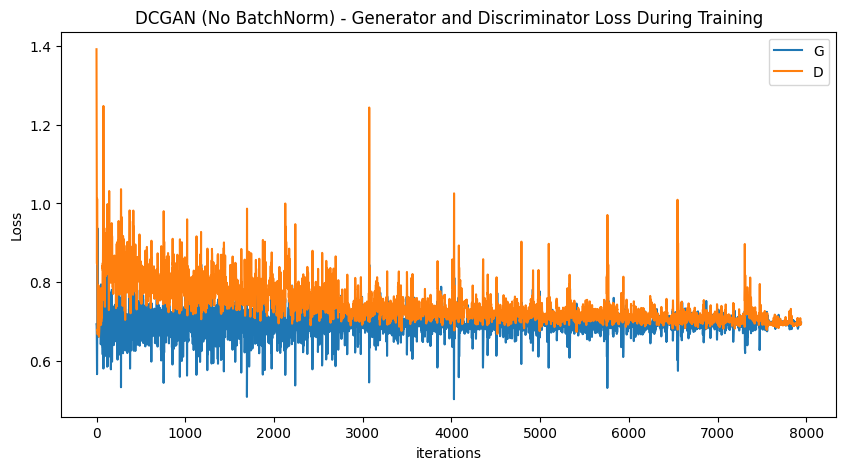

In [43]:
%matplotlib inline

plt.figure(figsize=(10,5))
plt.title("DCGAN (No BatchNorm) - Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()

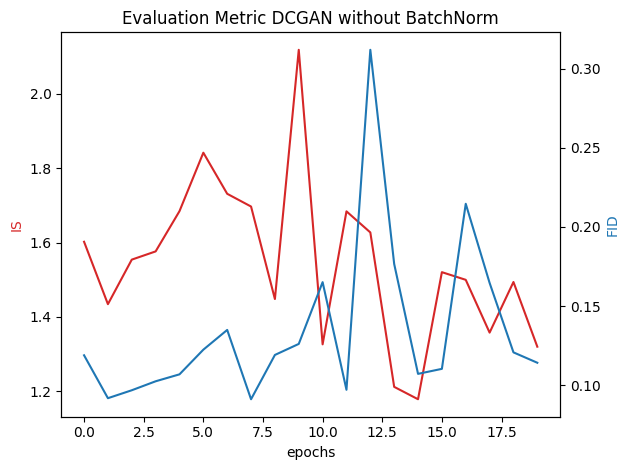

In [42]:
fig, ax1 = plt.subplots()

plt.title("Evaluation Metric DCGAN without BatchNorm")

color = 'tab:red'
ax1.set_xlabel('epochs')
ax1.set_ylabel('IS', color=color)
ax1.plot(is_values, color=color)

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('FID', color=color)
ax2.plot(fid_values, color=color)

fig.tight_layout()

**Real Images vs. Fake Images**

Finally, lets take a look at some real images and fake images side by side.



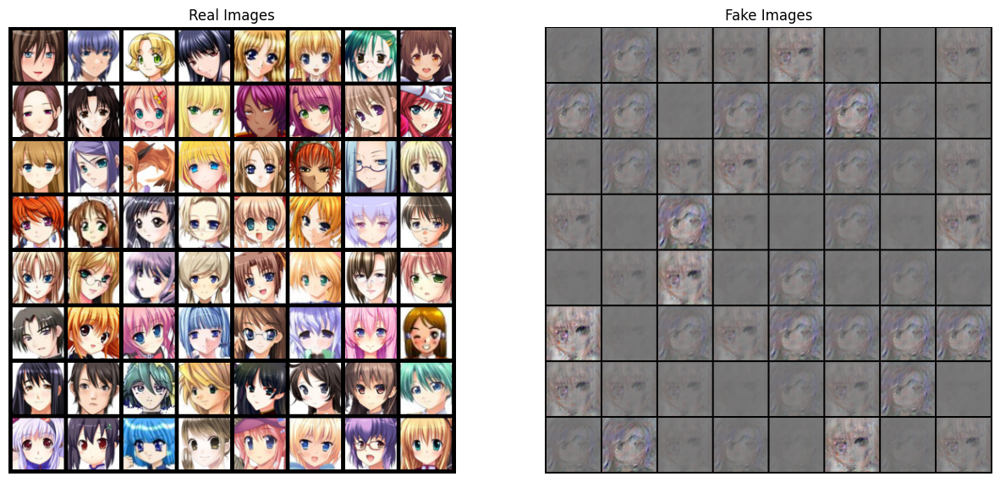

In [40]:
%matplotlib inline

# Grab a batch of real images from the dataloader
real_batch = next(iter(train_dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(vutils.make_grid(img_list[-1], padding=2, normalize=True).cpu(),(1,2,0)))